<a href="https://colab.research.google.com/github/shgyg99/handwrittenmathsolutions/blob/main/Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Import libs**

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
import os
import json
from PIL import Image
import warnings
warnings.filterwarnings("ignore")

import torch
from torch.utils.data import DataLoader, random_split, Dataset
import torch.optim as optim

import torchvision
from torchvision import transforms
from torchvision import tv_tensors
from torchvision.utils import make_grid
from torchvision.transforms import functional as F
from torchvision.io import decode_image

# **Utils**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
root = '/content/drive/MyDrive/detection'
n_epoch = 50


# **Usefull Functions**

In [65]:
import torch
import torchvision.transforms.v2 as transforms_v2

color_aug = transforms_v2.Compose([
    transforms_v2.ColorJitter(brightness=0.3, contrast=0.3),
    transforms_v2.GaussianBlur(kernel_size=3, sigma=(0.1, 1.0)),
    transforms_v2.RandomAdjustSharpness(sharpness_factor=2),
    transforms_v2.RandomAutocontrast(),
])

class AddGaussianNoise:
    def __init__(self, mean=0., std=0.05):
        self.mean = mean
        self.std = std

    def __call__(self, img):
        if isinstance(img, torch.Tensor):
            noise = torch.randn_like(img) * self.std + self.mean
            return img + noise
        return img

final_aug = transforms_v2.Compose([
    transforms_v2.RandomCrop(size=(827, 1169)),
    transforms_v2.RandomApply([color_aug], p=0.7),
    transforms_v2.ToTensor(),
    transforms_v2.Lambda(lambda x: AddGaussianNoise(mean=0, std=0.03)(x)),

    # transforms_v2.Normalize(
    #     mean=[0.485, 0.456, 0.406],
    #     std=[0.229, 0.224, 0.225]
    # ),
])

In [230]:
class FormulaDataset(Dataset):
    def __init__(self, root=''):
        self.images_list = []
        self.labels = []
        for item in os.listdir(os.path.join(root, 'images')):
            img_path = os.path.join(root, 'images', item)
            self.images_list.append(img_path)
            self.labels.append(os.path.join(root, 'annotation', '.'.join(item.split('.')[:-1]) + '.json'))


    def __getitem__(self, item):
        img_path = os.path.join(self.images_list[item])
        img = Image.open(img_path).convert('RGB')

        with open(self.labels[item]) as f:
            load = json.load(f)
            points = []
            for i in range(len(load['shapes'])):
                if (load['shapes'][i]['points'][1][0] < load['shapes'][i]['points'][0][0]) & (load['shapes'][i]['points'][0][1] < load['shapes'][i]['points'][1][1]):
                      points.append(
                          [load['shapes'][i]['points'][1][0],
                          load['shapes'][i]['points'][0][1],
                          load['shapes'][i]['points'][0][0],
                          load['shapes'][i]['points'][1][1]])
                else:
                    continue
        img = F.to_tensor(img)
        boxes = torch.tensor(points, dtype=torch.float32)
        boxes = tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=img.shape[-2:])

        labels = torch.ones((len(points), ), dtype=torch.int64)

        img, boxes = final_aug(img, boxes)
        if len(boxes) > 0:
          valid_boxes = []
          valid_labels = []

          for box, label in zip(boxes, labels):
              x1, y1, x2, y2 = box
              width = x2 - x1
              height = y2 - y1

              # اگر باکس معتبر است (ابعاد مثبت و مختصات غیرمنفی)
              if width > 1 and height > 1 and x1 >= 0 and y1 >= 0 and x2 >= 0 and y2 >= 0:
                  # اعمال clipping برای اطمینان از قرارگیری در تصویر
                  x1 = max(0, min(x1, img.shape[2]))
                  y1 = max(0, min(y1, img.shape[1]))
                  x2 = max(0, min(x2, img.shape[2]))
                  y2 = max(0, min(y2, img.shape[1]))

                  # بررسی مجدد اندازه پس از clipping
                  if x2 - x1 > 1 and y2 - y1 > 1:
                      valid_boxes.append([x1, y1, x2, y2])
                      valid_labels.append(label)

          if valid_boxes:
              boxes = torch.tensor(valid_boxes, dtype=torch.float32)
              labels = torch.tensor(valid_labels, dtype=torch.int64)
              boxes = tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=img.shape[-2:])
          else:
              boxes = torch.zeros((0, 4), dtype=torch.float32)
              labels = torch.zeros((0,), dtype=torch.int64)
        #
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        #
        return img, target

    def __len__(self):
        return len(self.images_list)

In [231]:
import math
def train_one_epoch(model, optimizer, train_loader, epoch=None):
    model.train()
    total_loss = 0
    with tqdm(train_loader, unit="batch") as tepoch:
        for images, targets in tepoch:
            if epoch is not None:
                tepoch.set_description(f"Epoch {epoch}")
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            total_loss += losses
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()
    return total_loss/len(train_loader)

In [232]:
def evaluate(model, test_dataloader):
    model.eval()
    with torch.no_grad():
        cnt = 0
        for images , targets in test_dataloader:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            out = model(images)
            scores = out[0]['scores'].cpu().numpy()
            inds = scores > 0.8
            bxs = out[0]['boxes'].cpu().numpy()
            bxs = bxs[inds]
            gt = targets[0]['boxes'].cpu().numpy()
            # gt = gt[0]
            img = images[0].permute(1, 2, 0).cpu().numpy()
            #----------------------------------------------------------
            fig, ax = plt.subplots(1)
            ax.imshow(img)
            plt.axis('off')
            for j in range(len(gt)):
                rect1 = patches.Rectangle((int(gt[j][0]),int(gt[j][1])),abs(gt[j][0]-gt[j][2]),
                                abs(gt[j][1]-gt[j][3]),linewidth=3,edgecolor='g',facecolor='none')
                ax.add_patch(rect1)
            for i in range(len(bxs)):
                rect = patches.Rectangle((int(bxs[i][0]),int(bxs[i][1])),abs(bxs[i][0]-bxs[i][2]),
                                        abs(bxs[i][1]-bxs[i][3]),linewidth=3,edgecolor='r',facecolor='none',)
                ax.add_patch(rect)


            fig.savefig(f"{root}/output_images/{cnt}.png".format(cnt), dpi=90, bbox_inches='tight')
            cnt = cnt + 1

# **DataLoader**

In [233]:
set_ = FormulaDataset(root=root)
train, test = random_split(set_, (int(9*(len(set_)/10)), len(set_) - int(9*(len(set_)/10))))
len(train), len(test)

(249, 28)

In [234]:
def new_concat(batch):
  return tuple(zip(*batch))

In [235]:
train_loader = DataLoader(train,
                            batch_size=2,
                            shuffle=True,
                            collate_fn=new_concat,
                            pin_memory=True)
test_loader = DataLoader(test,
                            batch_size=1,
                            shuffle=True,
                            collate_fn=new_concat)

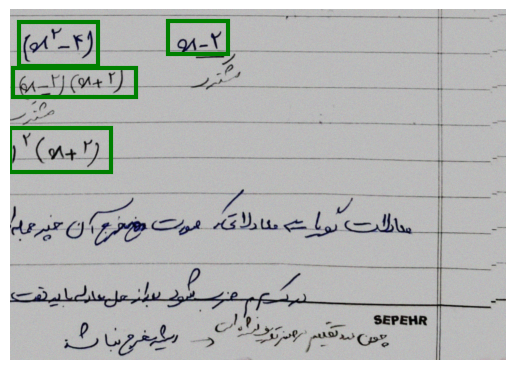

In [238]:
images, targets = next(iter(train_loader))

images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

gt = targets[0]['boxes'].cpu().numpy()
# gt = gt[0]
img = images[0].permute(1, 2, 0).cpu().numpy()
#----------------------------------------------------------
fig, ax = plt.subplots(1)
ax.imshow(img)
plt.axis('off')
for j in range(len(gt)):
    rect1 = patches.Rectangle((int(gt[j][0]),int(gt[j][1])),abs(gt[j][0]-gt[j][2]),
                    abs(gt[j][1]-gt[j][3]),linewidth=3,edgecolor='g',facecolor='none')
    ax.add_patch(rect1)

In [219]:
len(targets)

2

# **Model**

In [239]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(1024, 2)
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [240]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001,
                            momentum=0.9, weight_decay=0.0005)

In [242]:
num_epochs = 20

for epoch in range(num_epochs):
    loss = train_one_epoch(model, optimizer, train_loader)
    print('epoch [{}]:  \t loss: {}  '.format(epoch, loss))

100%|██████████| 125/125 [01:33<00:00,  1.34batch/s]


epoch [0]:  	 loss: 0.7780904173851013  


100%|██████████| 125/125 [01:28<00:00,  1.42batch/s]


epoch [1]:  	 loss: 0.774323582649231  


100%|██████████| 125/125 [01:31<00:00,  1.37batch/s]


epoch [2]:  	 loss: 0.7683218717575073  


100%|██████████| 125/125 [01:30<00:00,  1.38batch/s]


epoch [3]:  	 loss: 0.7566970586776733  


100%|██████████| 125/125 [01:33<00:00,  1.34batch/s]


epoch [4]:  	 loss: 0.744362473487854  


100%|██████████| 125/125 [01:28<00:00,  1.41batch/s]


epoch [5]:  	 loss: 0.7692750096321106  


100%|██████████| 125/125 [01:29<00:00,  1.40batch/s]


epoch [6]:  	 loss: 0.7785239815711975  


100%|██████████| 125/125 [01:29<00:00,  1.39batch/s]


epoch [7]:  	 loss: 0.7338943481445312  


100%|██████████| 125/125 [01:30<00:00,  1.38batch/s]


epoch [8]:  	 loss: 0.7409368753433228  


100%|██████████| 125/125 [01:30<00:00,  1.39batch/s]


epoch [9]:  	 loss: 0.7535289525985718  


100%|██████████| 125/125 [01:30<00:00,  1.38batch/s]


epoch [10]:  	 loss: 0.7065836787223816  


100%|██████████| 125/125 [01:30<00:00,  1.38batch/s]


epoch [11]:  	 loss: 0.6992562413215637  


100%|██████████| 125/125 [01:30<00:00,  1.38batch/s]


epoch [12]:  	 loss: 0.7910057902336121  


100%|██████████| 125/125 [01:31<00:00,  1.37batch/s]


epoch [13]:  	 loss: 0.7119059562683105  


100%|██████████| 125/125 [01:28<00:00,  1.41batch/s]


epoch [14]:  	 loss: 0.7069709897041321  


100%|██████████| 125/125 [01:30<00:00,  1.39batch/s]


epoch [15]:  	 loss: 0.7325208187103271  


100%|██████████| 125/125 [01:32<00:00,  1.35batch/s]


epoch [16]:  	 loss: 0.7323593497276306  


100%|██████████| 125/125 [01:31<00:00,  1.36batch/s]


epoch [17]:  	 loss: 0.6852537989616394  


100%|██████████| 125/125 [01:28<00:00,  1.41batch/s]


epoch [18]:  	 loss: 0.6915243864059448  


100%|██████████| 125/125 [01:30<00:00,  1.38batch/s]

epoch [19]:  	 loss: 0.7059519290924072  


In [243]:
torch.save(model, os.path.join(root, 'detection_model_0.70.pt'))

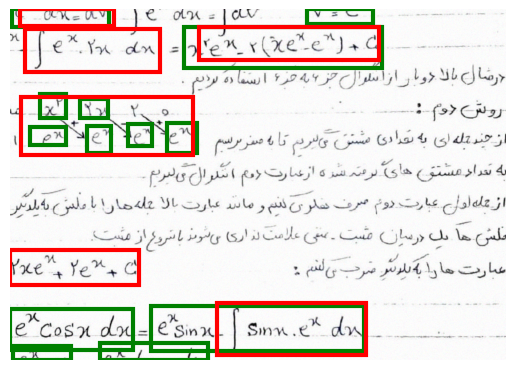

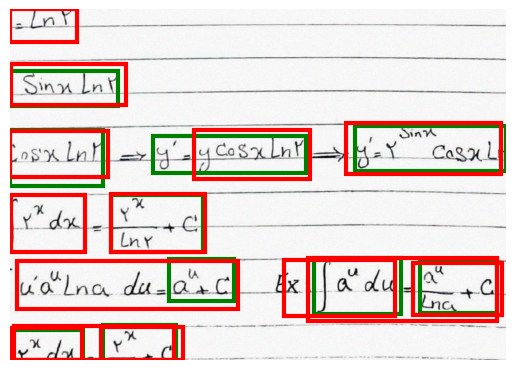

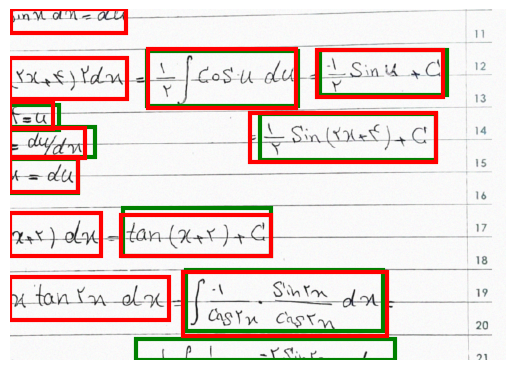

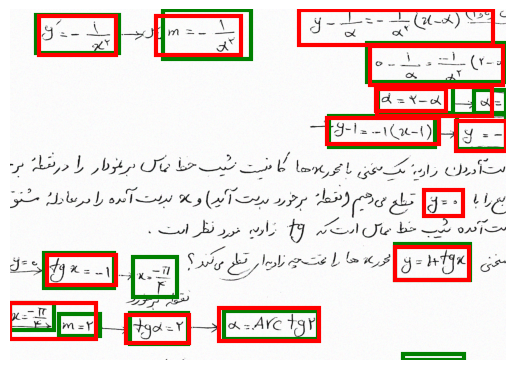

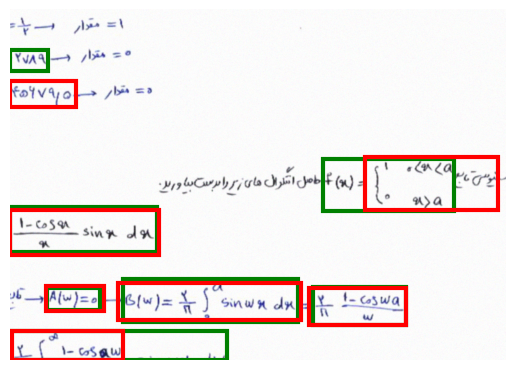

...

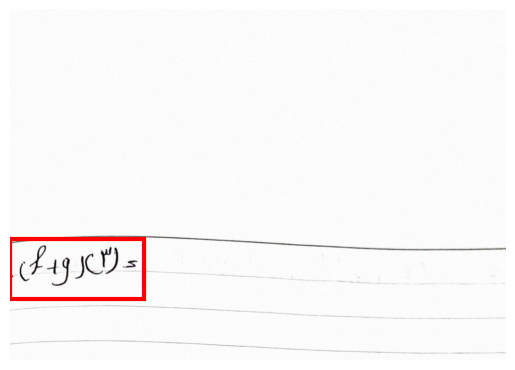

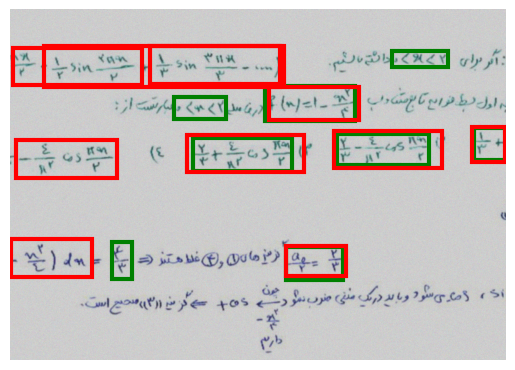

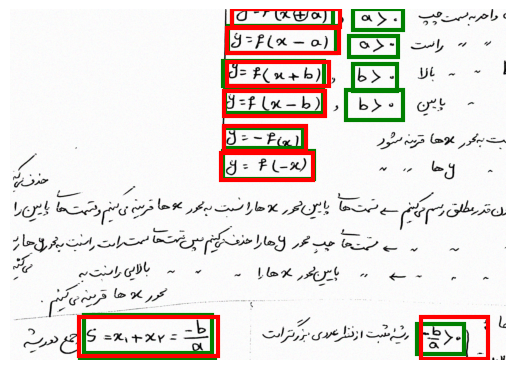

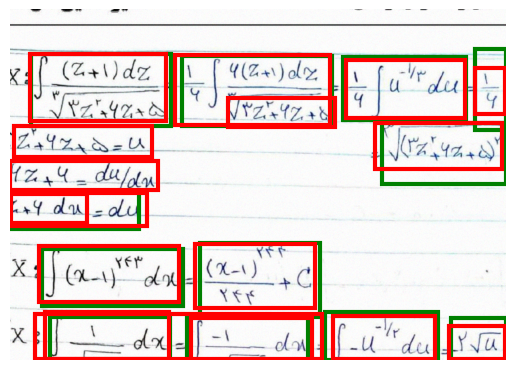

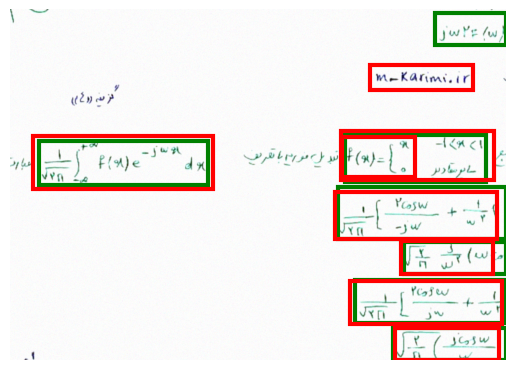

In [244]:
evaluate(model, test_loader)